# Attention mechanisms in practice

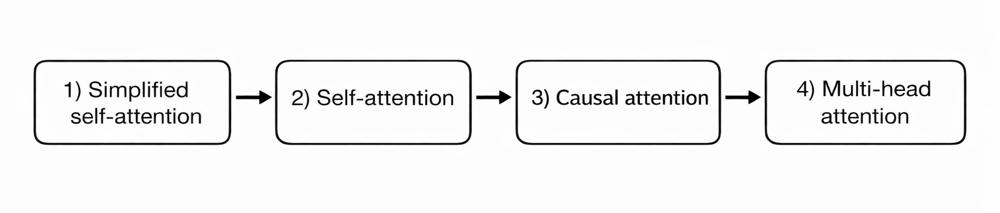

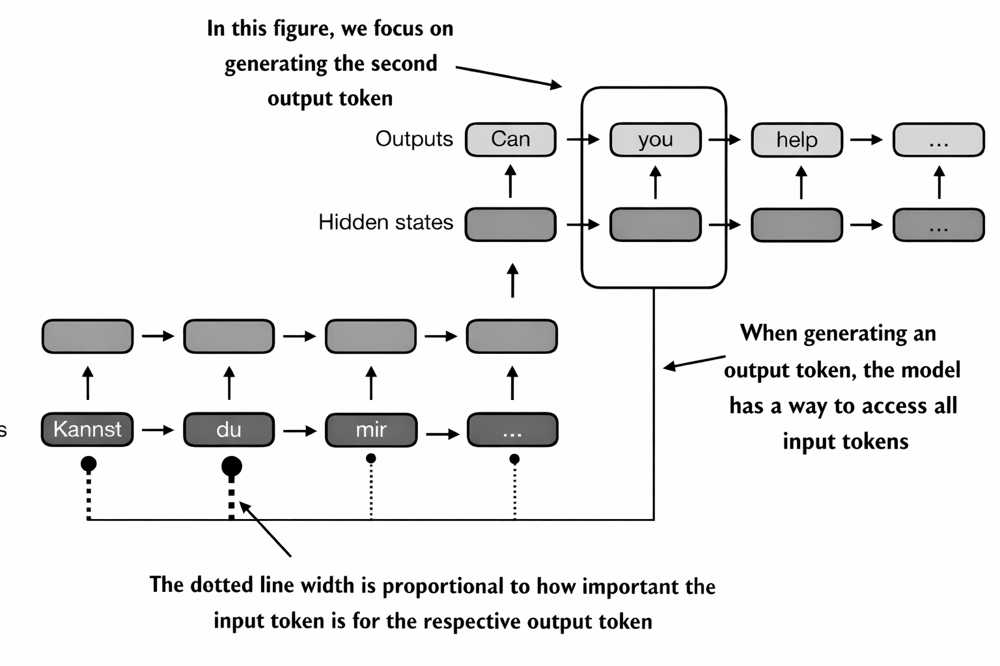

## Simplified self-attention (without trainable weights)

In [1]:
import torch

In [2]:
# a dummy embedded input (dim=3)
inputs = torch.tensor(
  [[0.43, 0.15, 0.89], # Your     (x^1)
   [0.55, 0.87, 0.66], # journey  (x^2)
   [0.57, 0.85, 0.64], # starts   (x^3)
   [0.22, 0.58, 0.33], # with     (x^4)
   [0.77, 0.25, 0.10], # one      (x^5)
   [0.05, 0.80, 0.55]] # step     (x^6)
)

### Step 1: Compute (unormalized) attention scores for a query token

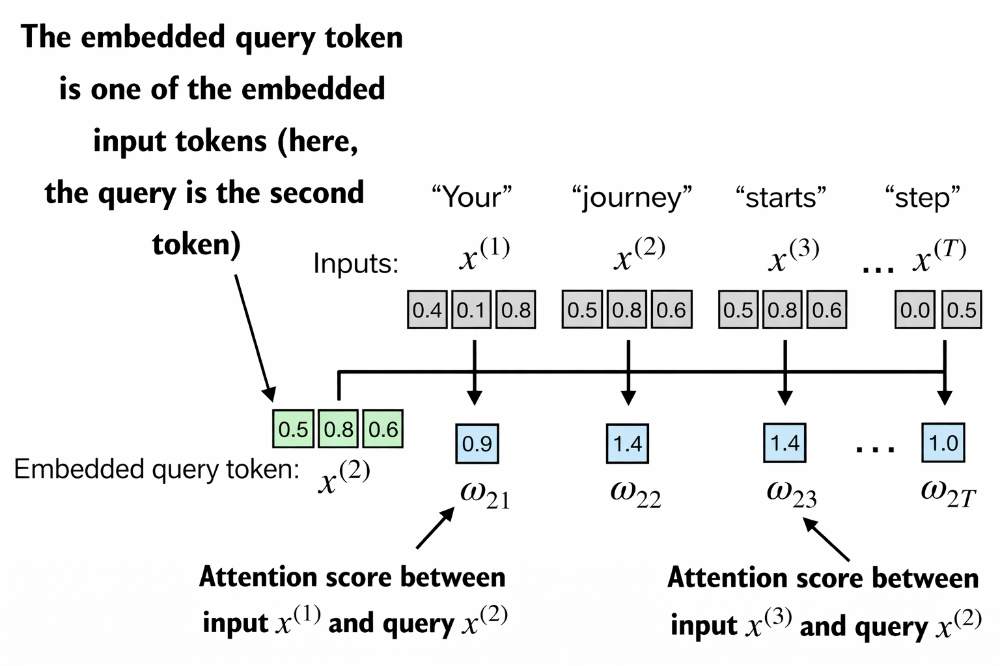

In [3]:
# dot product (take inputs[1] as the 'query')
att_score = 0.55 * 0.43 + 0.87 * 0.15 + 0.66 * 0.89
print(att_score)

# res = 0
# for idx, element in enumerate(inputs[0]):
#   res += inputs[0][idx] * inputs[1][idx]
# print(res)

att_score = torch.dot(inputs[0], inputs[1])
print(att_score)

0.9544
tensor(0.9544)


In [4]:
# use of dot product as a way to measure the similarity of 2 vectors
query = inputs[0]
print(query)

attn_scores_1 = torch.empty(inputs.shape[0])
for i, x_i in enumerate(inputs):
  attn_scores_1[i] = torch.dot(x_i, query)

print(attn_scores_1)

tensor([0.4300, 0.1500, 0.8900])
tensor([0.9995, 0.9544, 0.9422, 0.4753, 0.4576, 0.6310])


In [5]:
# another example
query = inputs[1]  # 2nd input token is the query
print(query)

attn_scores_2 = torch.empty(inputs.shape[0])
print(inputs.shape, attn_scores_2.shape)

for i, x_i in enumerate(inputs):
  attn_scores_2[i] = torch.dot(x_i, query) # dot product (transpose not necessary here since they are 1-dim vectors)

print(attn_scores_2)

tensor([0.5500, 0.8700, 0.6600])
torch.Size([6, 3]) torch.Size([6])
tensor([0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0865])


### Step 2: Compute attention weights (normalized attention scores) for a query token

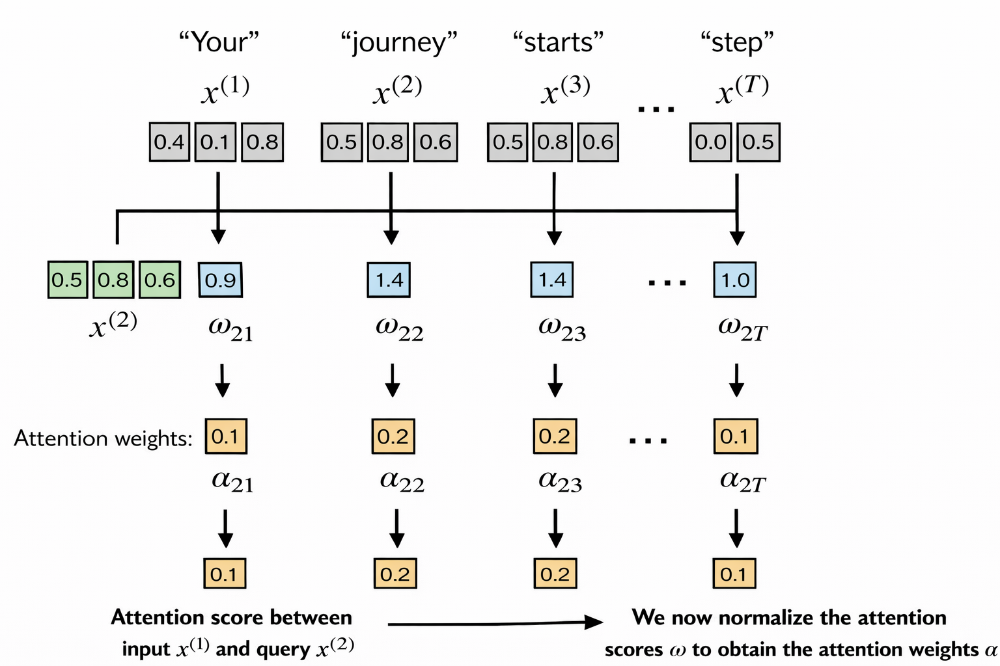

In [9]:
attn_weights_2_tmp = attn_scores_2 / attn_scores_2.sum() # these weights will be optimized during training

print("Attention weights:", attn_weights_2_tmp)
print("Attention weights shape:", attn_weights_2_tmp.shape)
print("Sum:", attn_weights_2_tmp.sum())

Attention weights: tensor([0.1455, 0.2278, 0.2249, 0.1285, 0.1077, 0.1656])
Attention weights shape: torch.Size([6])
Sum: tensor(1.0000)


In [7]:
# in pracatice, we use softmax for this 'normalization'
def softmax_naive(x):
  return torch.exp(x) / torch.exp(x).sum(dim=0)

attn_weights_2_naive = softmax_naive(attn_scores_2)

print("Attention weights:", attn_weights_2_naive)
print("Sum:", attn_weights_2_naive.sum())

Attention weights: tensor([0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581])
Sum: tensor(1.)


In [11]:
# sanity check with torch.softmax
attn_weights_2 = torch.softmax(attn_scores_2, dim=0)
print("Attention weights with 'torch.softmax':", attn_weights_2)
print("Sum:", attn_weights_2.sum())

Attention weights with 'torch.softmax': tensor([0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581])
Sum: tensor(1.)


### Step 3: Compute the context vector for a query token

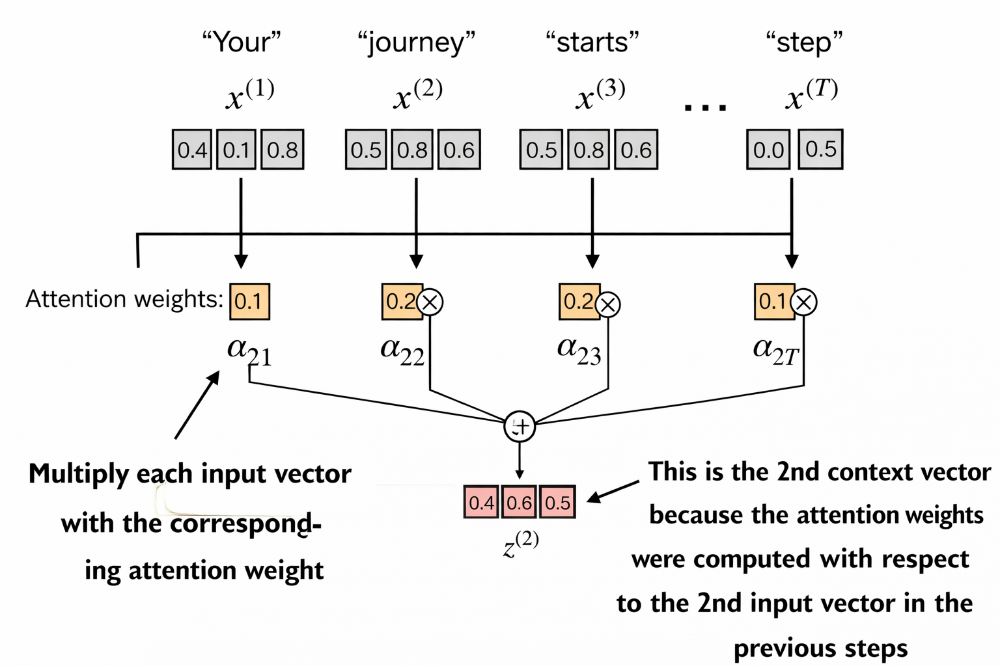

In [17]:
query = inputs[1] # 2nd input token is the query

context_vec_2 = torch.zeros(query.shape)
for i, x_i in enumerate(inputs):
  # print(f"{attn_weights_2[i]} ----> {inputs[i]}")
  context_vec_2 += attn_weights_2[i]*x_i

print(context_vec_2)
print(context_vec_2.shape)

tensor([0.4419, 0.6515, 0.5683])
torch.Size([3])


### Step 4: Generalize for all input tokens

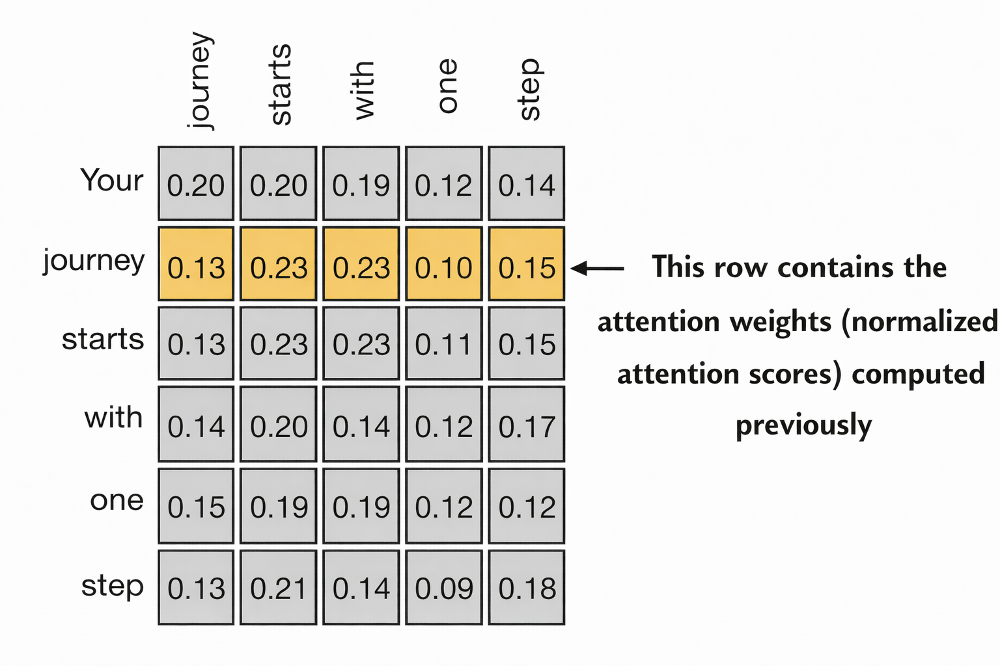

In [13]:
# step 1
attn_scores = torch.empty(6, 6)

for i, x_i in enumerate(inputs):
  for j, x_j in enumerate(inputs):
    attn_scores[i, j] = torch.dot(x_i, x_j)

print(attn_scores)
print(attn_scores.shape)

tensor([[0.9995, 0.9544, 0.9422, 0.4753, 0.4576, 0.6310],
        [0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0865],
        [0.9422, 1.4754, 1.4570, 0.8296, 0.7154, 1.0605],
        [0.4753, 0.8434, 0.8296, 0.4937, 0.3474, 0.6565],
        [0.4576, 0.7070, 0.7154, 0.3474, 0.6654, 0.2935],
        [0.6310, 1.0865, 1.0605, 0.6565, 0.2935, 0.9450]])
torch.Size([6, 6])


In [14]:
# or do this
attn_scores = inputs @ inputs.T
print(attn_scores)

tensor([[0.9995, 0.9544, 0.9422, 0.4753, 0.4576, 0.6310],
        [0.9544, 1.4950, 1.4754, 0.8434, 0.7070, 1.0865],
        [0.9422, 1.4754, 1.4570, 0.8296, 0.7154, 1.0605],
        [0.4753, 0.8434, 0.8296, 0.4937, 0.3474, 0.6565],
        [0.4576, 0.7070, 0.7154, 0.3474, 0.6654, 0.2935],
        [0.6310, 1.0865, 1.0605, 0.6565, 0.2935, 0.9450]])


In [18]:
# step 2
attn_weights = torch.softmax(attn_scores, dim=-1)
print(attn_weights)

tensor([[0.2098, 0.2006, 0.1981, 0.1242, 0.1220, 0.1452],
        [0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581],
        [0.1390, 0.2369, 0.2326, 0.1242, 0.1108, 0.1565],
        [0.1435, 0.2074, 0.2046, 0.1462, 0.1263, 0.1720],
        [0.1526, 0.1958, 0.1975, 0.1367, 0.1879, 0.1295],
        [0.1385, 0.2184, 0.2128, 0.1420, 0.0988, 0.1896]])


In [19]:
# sanity ccheck that each row sum is 1
row_2_sum = sum([0.1385, 0.2379, 0.2333, 0.1240, 0.1082, 0.1581])
print("Row 2 sum:", row_2_sum)

print("All row sums:", attn_weights.sum(dim=-1))

Row 2 sum: 1.0
All row sums: tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000])


In [20]:
# step 3
all_context_vecs = attn_weights @ inputs
print(all_context_vecs)
print(all_context_vecs.shape)

tensor([[0.4421, 0.5931, 0.5790],
        [0.4419, 0.6515, 0.5683],
        [0.4431, 0.6496, 0.5671],
        [0.4304, 0.6298, 0.5510],
        [0.4671, 0.5910, 0.5266],
        [0.4177, 0.6503, 0.5645]])
torch.Size([6, 3])


In [21]:
# sanity check with our previous context vector for 2nd token
print("Previous 2nd context vector:", context_vec_2)

Previous 2nd context vector: tensor([0.4419, 0.6515, 0.5683])


## Self-attention (with trainable weights)

### Self-attention for a query token

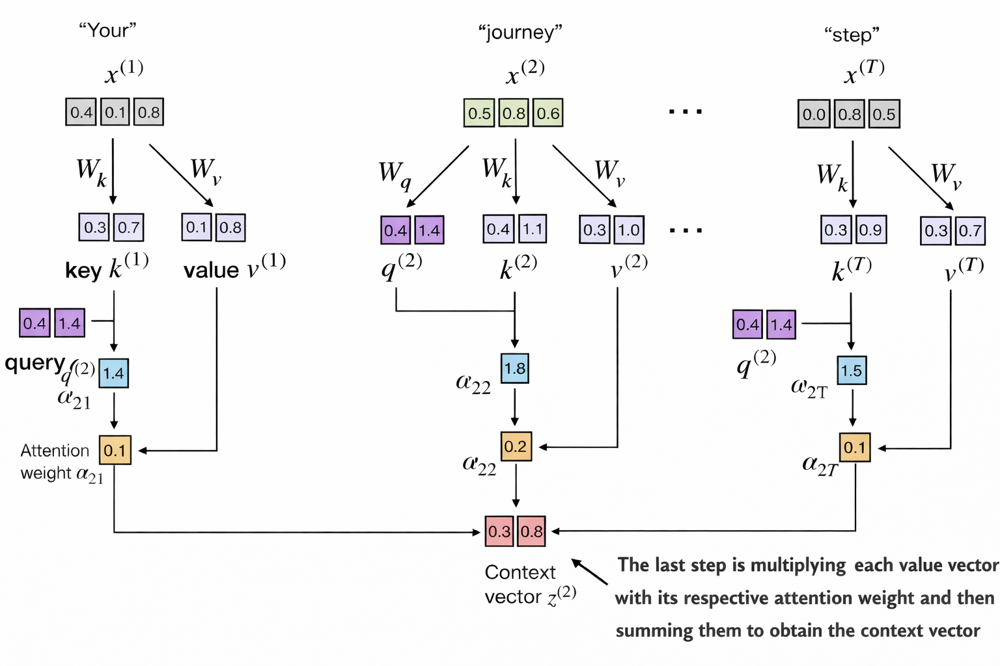

Step 1: Initialize Ws and compute keys and values.

In [22]:
print(inputs)

x_2 = inputs[1] # second input element
d_in = inputs.shape[1] # the input embedding size, d=3
d_out = 2 # the output embedding size, d=2

tensor([[0.4300, 0.1500, 0.8900],
        [0.5500, 0.8700, 0.6600],
        [0.5700, 0.8500, 0.6400],
        [0.2200, 0.5800, 0.3300],
        [0.7700, 0.2500, 0.1000],
        [0.0500, 0.8000, 0.5500]])


In [23]:
torch.manual_seed(42)

W_query = torch.nn.Parameter(torch.rand(d_in, d_out), requires_grad=False)
W_key = torch.nn.Parameter(torch.rand(d_in, d_out), requires_grad=False)
W_value = torch.nn.Parameter(torch.rand(d_in, d_out), requires_grad=False)

In [29]:
print(W_query)
print(x_2)
print(x_2.shape, W_query.shape)

Parameter containing:
tensor([[0.8823, 0.9150],
        [0.3829, 0.9593],
        [0.3904, 0.6009]])
tensor([0.5500, 0.8700, 0.6600])
torch.Size([3]) torch.Size([3, 2])


In [28]:
# linear transformation of 3-dim embedding to 2-dim of the second token
query_2 = x_2 @ W_query # _2 because it's with respect to the 2nd input element
key_2 = x_2 @ W_key
value_2 = x_2 @ W_value

print(query_2, query_2.shape)

tensor([1.0760, 1.7344]) torch.Size([2])


In [30]:
# compute keys and values for the entire input
keys = inputs @ W_key
values = inputs @ W_value

print("keys.shape:", keys.shape)
print("values.shape:", values.shape)

keys.shape: torch.Size([6, 2])
values.shape: torch.Size([6, 2])


Step 2: Compute the (unormalized) attention scores for a query token.

In [33]:
keys_2 = keys[1] # python starts index at 0
attn_score_22 = query_2.dot(keys_2)
print(attn_score_22)

tensor(3.3338)


In [34]:
attn_scores_2 = query_2 @ keys.T # all attention scores for given query
print(attn_scores_2)
print(attn_scores_2.shape)

tensor([2.7084, 3.3338, 3.3013, 1.7563, 1.7869, 2.1966])
torch.Size([6])


Step 3: Compute the attention weights (normalized attention scores) for a query token.

In [35]:
d_k = keys.shape[1]
attn_weights_2 = torch.softmax(attn_scores_2 / d_k**0.5, dim=-1)
print(attn_weights_2)

tensor([0.1723, 0.2681, 0.2620, 0.0879, 0.0898, 0.1200])


Step 4: Compute the context vector for a query token.

In [36]:
context_vec_2 = attn_weights_2 @ values
print(context_vec_2)
print(context_vec_2.shape)

tensor([1.4201, 0.8892])
torch.Size([2])


### Self-attention for all input tokens

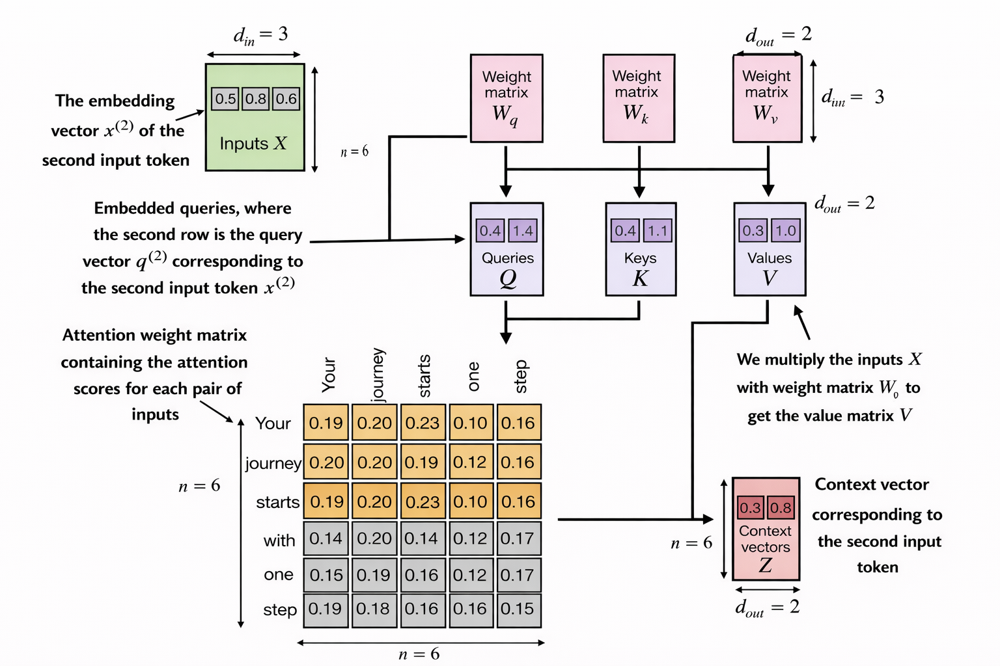

In [37]:
import torch.nn as nn

class SelfAttention_v1(nn.Module):

  def __init__(self, d_in, d_out):
    super().__init__()
    self.W_query = nn.Parameter(torch.rand(d_in, d_out))
    self.W_key = nn.Parameter(torch.rand(d_in, d_out))
    self.W_value = nn.Parameter(torch.rand(d_in, d_out))

  def forward(self, x):
    keys = x @ self.W_key
    queries = x @ self.W_query
    values = x @ self.W_value

    attn_scores = queries @ keys.T # omega
    attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5, dim=-1) # alpha

    context_vec = attn_weights @ values
    return context_vec

In [41]:
torch.manual_seed(42)
sa_v1 = SelfAttention_v1(d_in, d_out)
# print(inputs)
print(sa_v1(inputs))

tensor([[1.3751, 0.8610],
        [1.4201, 0.8892],
        [1.4198, 0.8890],
        [1.3533, 0.8476],
        [1.3746, 0.8606],
        [1.3620, 0.8532]], grad_fn=<MmBackward0>)


In [44]:
# sanity check with the previous computation for the second token
print(context_vec_2)

tensor([1.4201, 0.8892])


In [42]:
# an equivalent way is to use nn.Linear for matrix multiplication if we disable the bias units, which has a preferred weight initialization scheme that leads to more stable model training
class SelfAttention_v2(nn.Module):

  def __init__(self, d_in, d_out, qkv_bias=False):
    super().__init__()
    self.W_query = nn.Linear(d_in, d_out, bias=qkv_bias)
    self.W_key   = nn.Linear(d_in, d_out, bias=qkv_bias)
    self.W_value = nn.Linear(d_in, d_out, bias=qkv_bias)

  def forward(self, x):
    keys = self.W_key(x)
    queries = self.W_query(x)
    values = self.W_value(x)

    attn_scores = queries @ keys.T
    attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5, dim=-1)

    context_vec = attn_weights @ values
    return context_vec

In [43]:
torch.manual_seed(42)
sa_v2 = SelfAttention_v2(d_in, d_out)
print(sa_v2(inputs)) # notice that SelfAttention_v1 and SelfAttention_v2 give different outputs because they use different initial weights for the weight matrices

tensor([[0.3755, 0.2777],
        [0.3761, 0.2831],
        [0.3761, 0.2833],
        [0.3768, 0.2763],
        [0.3754, 0.2836],
        [0.3772, 0.2746]], grad_fn=<MmBackward0>)


## Causual attention

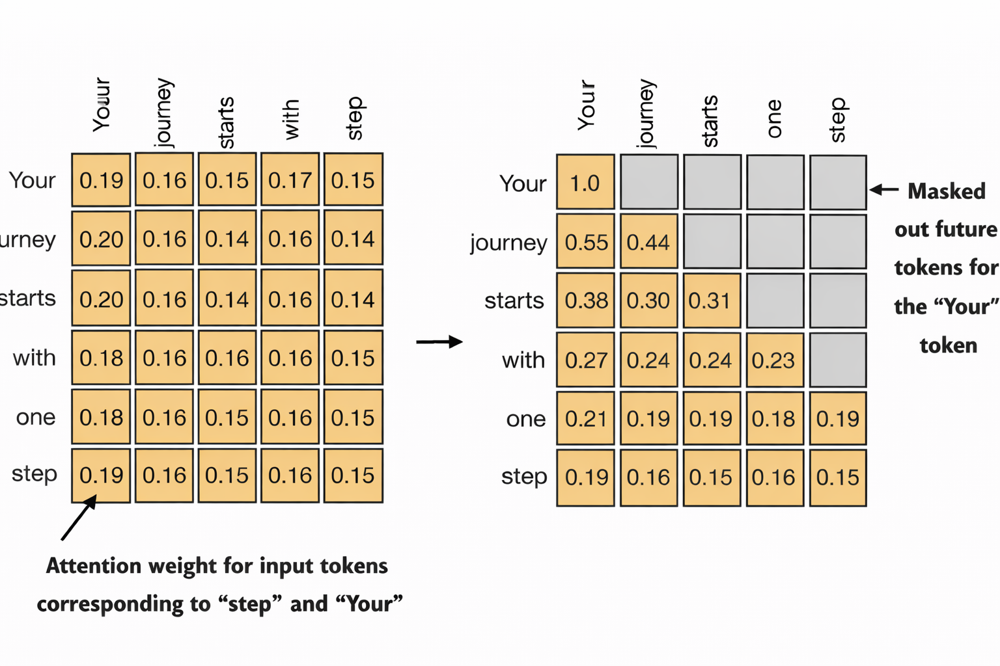

### Straitforward approach

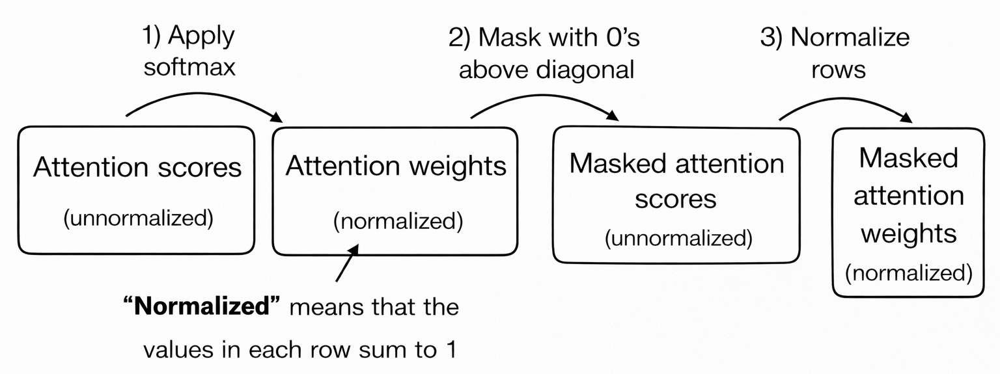

In [46]:
# reuse the query and key weight matrices of the SelfAttention_v2 object from the previous section (left table)
queries = sa_v2.W_query(inputs)
keys = sa_v2.W_key(inputs)
attn_scores = queries @ keys.T

attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5, dim=-1)
print(attn_weights)
print(attn_weights.shape)

tensor([[0.1605, 0.1726, 0.1714, 0.1681, 0.1473, 0.1801],
        [0.1627, 0.1780, 0.1758, 0.1648, 0.1306, 0.1880],
        [0.1625, 0.1782, 0.1759, 0.1648, 0.1302, 0.1885],
        [0.1661, 0.1726, 0.1715, 0.1654, 0.1475, 0.1768],
        [0.1596, 0.1777, 0.1755, 0.1664, 0.1312, 0.1896],
        [0.1682, 0.1715, 0.1707, 0.1648, 0.1511, 0.1738]],
       grad_fn=<SoftmaxBackward0>)
torch.Size([6, 6])


In [47]:
# create a mask using torch.tril
context_length = attn_scores.shape[0]
mask_simple = torch.tril(torch.ones(context_length, context_length))
print(mask_simple)
print(mask_simple.shape)

tensor([[1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0.],
        [1., 1., 1., 0., 0., 0.],
        [1., 1., 1., 1., 0., 0.],
        [1., 1., 1., 1., 1., 0.],
        [1., 1., 1., 1., 1., 1.]])
torch.Size([6, 6])


In [48]:
# apply the  mask to sa (ledt table) to produce the right table
masked_simple = attn_weights*mask_simple
print(masked_simple)
print(masked_simple.shape)

tensor([[0.1605, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.1627, 0.1780, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.1625, 0.1782, 0.1759, 0.0000, 0.0000, 0.0000],
        [0.1661, 0.1726, 0.1715, 0.1654, 0.0000, 0.0000],
        [0.1596, 0.1777, 0.1755, 0.1664, 0.1312, 0.0000],
        [0.1682, 0.1715, 0.1707, 0.1648, 0.1511, 0.1738]],
       grad_fn=<MulBackward0>)
torch.Size([6, 6])


In [50]:
# check if the sum of all rows is eqqual to 1
print(masked_simple.sum(dim=-1))

tensor([0.1605, 0.3408, 0.5166, 0.6757, 0.8104, 1.0000],
       grad_fn=<SumBackward1>)


In [51]:
# re-normalize the outputs to sum to 1 again to avoid unintended effects
row_sums = masked_simple.sum(dim=-1, keepdim=True)
masked_simple_norm = masked_simple / row_sums
print(masked_simple_norm)

tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.4775, 0.5225, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.3146, 0.3450, 0.3405, 0.0000, 0.0000, 0.0000],
        [0.2459, 0.2555, 0.2538, 0.2448, 0.0000, 0.0000],
        [0.1969, 0.2193, 0.2165, 0.2053, 0.1619, 0.0000],
        [0.1682, 0.1715, 0.1707, 0.1648, 0.1511, 0.1738]],
       grad_fn=<DivBackward0>)


### Simpler approach

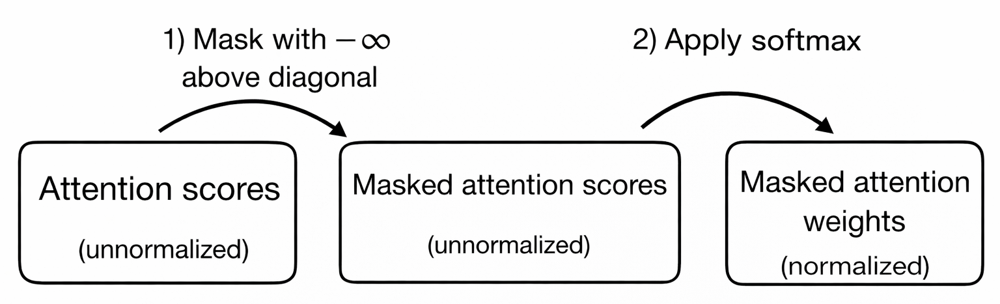

In [52]:
mask = torch.triu(torch.ones(context_length, context_length), diagonal=1)

# stepp 1
masked = attn_scores.masked_fill(mask.bool(), -torch.inf)
print(masked)
print(masked.shape)

tensor([[ 0.0508,    -inf,    -inf,    -inf,    -inf,    -inf],
        [ 0.2157,  0.3428,    -inf,    -inf,    -inf,    -inf],
        [ 0.2163,  0.3467,  0.3282,    -inf,    -inf,    -inf],
        [ 0.1257,  0.1799,  0.1707,  0.1191,    -inf,    -inf],
        [ 0.1667,  0.3193,  0.3012,  0.2258, -0.1098,    -inf],
        [ 0.1269,  0.1548,  0.1475,  0.0978, -0.0247,  0.1731]],
       grad_fn=<MaskedFillBackward0>)
torch.Size([6, 6])


In [53]:
# step 2
attn_weights = torch.softmax(masked / keys.shape[-1]**0.5, dim=-1)
print(attn_weights)

tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.4775, 0.5225, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.3146, 0.3450, 0.3405, 0.0000, 0.0000, 0.0000],
        [0.2459, 0.2555, 0.2538, 0.2448, 0.0000, 0.0000],
        [0.1969, 0.2193, 0.2165, 0.2053, 0.1619, 0.0000],
        [0.1682, 0.1715, 0.1707, 0.1648, 0.1511, 0.1738]],
       grad_fn=<SoftmaxBackward0>)


### Adding dropout

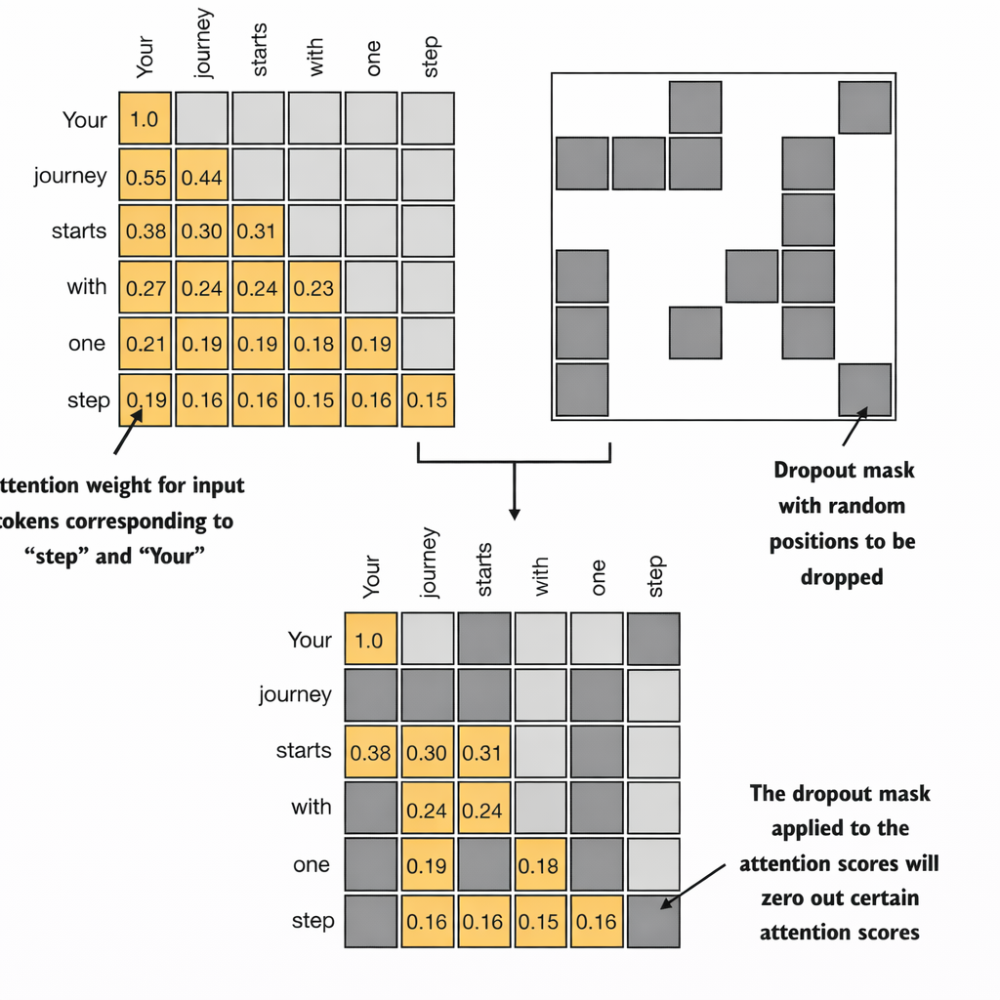

In [57]:
# inspect dropout layer
torch.manual_seed(42)
dropout = torch.nn.Dropout(0.5) # dropout rate of 50%
example = torch.ones(6, 6) # create a matrix of ones
# print(example)

print(dropout(example))

tensor([[2., 2., 2., 2., 0., 2.],
        [0., 0., 2., 2., 2., 2.],
        [0., 0., 2., 0., 2., 0.],
        [0., 2., 2., 0., 2., 2.],
        [2., 2., 0., 2., 2., 2.],
        [2., 2., 2., 2., 0., 0.]])


In [58]:
# apply dropout to casual masked attention weights
torch.manual_seed(42)
print(attn_weights) # without dropout
print(dropout(attn_weights))

tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.4775, 0.5225, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.3146, 0.3450, 0.3405, 0.0000, 0.0000, 0.0000],
        [0.2459, 0.2555, 0.2538, 0.2448, 0.0000, 0.0000],
        [0.1969, 0.2193, 0.2165, 0.2053, 0.1619, 0.0000],
        [0.1682, 0.1715, 0.1707, 0.1648, 0.1511, 0.1738]],
       grad_fn=<SoftmaxBackward0>)
tensor([[2.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.6809, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.5110, 0.5077, 0.0000, 0.0000, 0.0000],
        [0.3938, 0.4387, 0.0000, 0.4106, 0.3239, 0.0000],
        [0.3364, 0.3431, 0.3413, 0.3295, 0.0000, 0.0000]],
       grad_fn=<MulBackward0>)


### Compact causal self-attention class

In [59]:
batch = torch.stack((inputs, inputs), dim=0)
print(batch)
print(batch.shape) # 2 inputs with 6 tokens each, and each token has embedding dimension 3

tensor([[[0.4300, 0.1500, 0.8900],
         [0.5500, 0.8700, 0.6600],
         [0.5700, 0.8500, 0.6400],
         [0.2200, 0.5800, 0.3300],
         [0.7700, 0.2500, 0.1000],
         [0.0500, 0.8000, 0.5500]],

        [[0.4300, 0.1500, 0.8900],
         [0.5500, 0.8700, 0.6600],
         [0.5700, 0.8500, 0.6400],
         [0.2200, 0.5800, 0.3300],
         [0.7700, 0.2500, 0.1000],
         [0.0500, 0.8000, 0.5500]]])
torch.Size([2, 6, 3])


In [60]:
class CausalAttention(nn.Module):

  def __init__(self, d_in, d_out, context_length, dropout, qkv_bias=False):
    super().__init__()
    self.d_out = d_out
    self.W_query = nn.Linear(d_in, d_out, bias=qkv_bias)
    self.W_key = nn.Linear(d_in, d_out, bias=qkv_bias)
    self.W_value = nn.Linear(d_in, d_out, bias=qkv_bias)
    self.dropout = nn.Dropout(dropout)
    self.register_buffer('mask', torch.triu(torch.ones(context_length, context_length), diagonal=1)) # prevent moving it to gpu when training

  def forward(self, x):
    b, num_tokens, d_in = x.shape
    # for inputs where `num_tokens` exceeds `context_length`, this will result in errors in the mask creation further below
    # in practice, this is not a problem since the LLM will ensure that inputs do not exceed `context_length` before reaching this forward method
    keys = self.W_key(x)
    queries = self.W_query(x)
    values = self.W_value(x)

    attn_scores = queries @ keys.transpose(1, 2)
    attn_scores.masked_fill_(self.mask.bool()[:num_tokens, :num_tokens], -torch.inf) # `:num_tokens` to account for cases where the number of tokens in the batch is smaller than the supported context_size
    attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5, dim=-1)
    attn_weights = self.dropout(attn_weights)

    context_vec = attn_weights @ values
    return context_vec

In [61]:
torch.manual_seed(42)

context_length = batch.shape[1]
ca = CausalAttention(d_in, d_out, context_length, 0.0)

context_vecs = ca(batch)

print(context_vecs)
print("context_vecs.shape:", context_vecs.shape)

tensor([[[0.4429, 0.1077],
         [0.4656, 0.2597],
         [0.4732, 0.3030],
         [0.4135, 0.2921],
         [0.4078, 0.2567],
         [0.3772, 0.2746]],

        [[0.4429, 0.1077],
         [0.4656, 0.2597],
         [0.4732, 0.3030],
         [0.4135, 0.2921],
         [0.4078, 0.2567],
         [0.3772, 0.2746]]], grad_fn=<UnsafeViewBackward0>)
context_vecs.shape: torch.Size([2, 6, 2])


## Multi-head attention

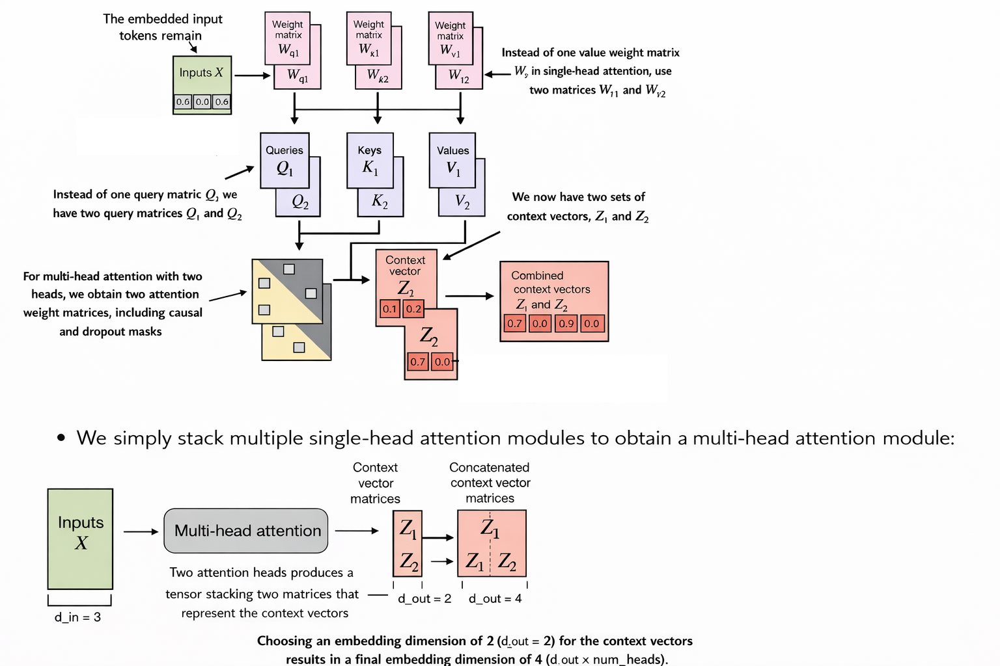

There 2 ways to create multi-head attention heads. The second is preferred as it is much cheaaper.

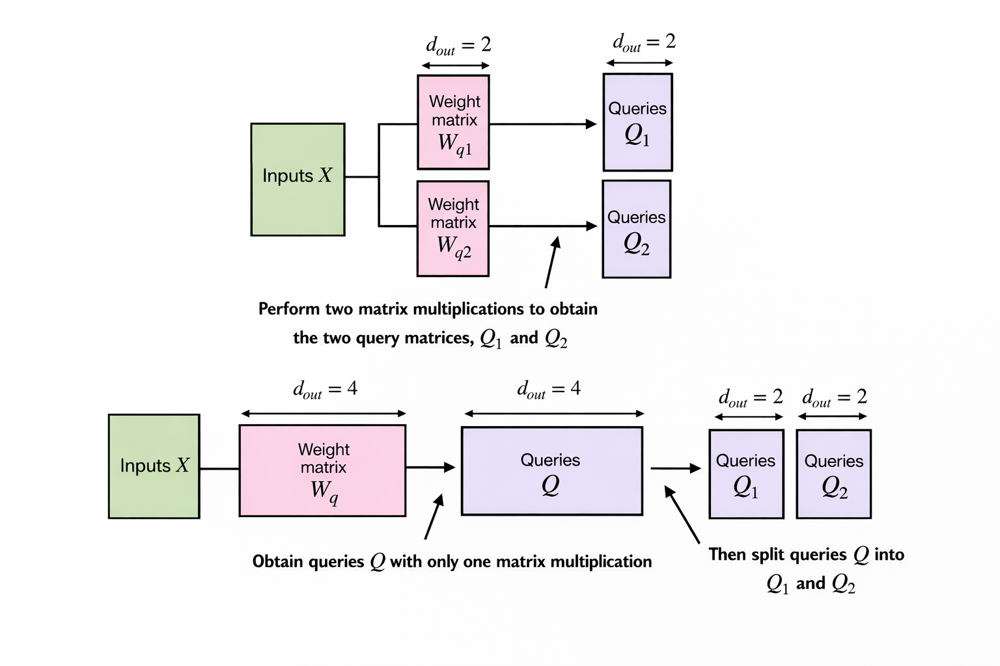

### Stacking multiple single-head attention layers

In [62]:
class MultiHeadAttentionWrapper(nn.Module):

  def __init__(self, d_in, d_out, context_length, dropout, num_heads, qkv_bias=False):
    super().__init__()
    self.heads = nn.ModuleList([CausalAttention(d_in, d_out, context_length, dropout, qkv_bias) for _ in range(num_heads)])

  def forward(self, x):
    return torch.cat([head(x) for head in self.heads], dim=-1)

In [64]:
print(batch)

tensor([[[0.4300, 0.1500, 0.8900],
         [0.5500, 0.8700, 0.6600],
         [0.5700, 0.8500, 0.6400],
         [0.2200, 0.5800, 0.3300],
         [0.7700, 0.2500, 0.1000],
         [0.0500, 0.8000, 0.5500]],

        [[0.4300, 0.1500, 0.8900],
         [0.5500, 0.8700, 0.6600],
         [0.5700, 0.8500, 0.6400],
         [0.2200, 0.5800, 0.3300],
         [0.7700, 0.2500, 0.1000],
         [0.0500, 0.8000, 0.5500]]])


In [63]:
torch.manual_seed(42)

context_length = batch.shape[1] # number of tokens
d_in, d_out = 3, 2
mha = MultiHeadAttentionWrapper(d_in, d_out, context_length, 0.0, num_heads=2)

context_vecs = mha(batch)

print(context_vecs)
print("context_vecs.shape:", context_vecs.shape)

tensor([[[0.4429, 0.1077, 0.5473, 0.3307],
         [0.4656, 0.2597, 0.3479, 0.2264],
         [0.4732, 0.3030, 0.2865, 0.1919],
         [0.4135, 0.2921, 0.2116, 0.1527],
         [0.4078, 0.2567, 0.2343, 0.1352],
         [0.3772, 0.2746, 0.1743, 0.1205]],

        [[0.4429, 0.1077, 0.5473, 0.3307],
         [0.4656, 0.2597, 0.3479, 0.2264],
         [0.4732, 0.3030, 0.2865, 0.1919],
         [0.4135, 0.2921, 0.2116, 0.1527],
         [0.4078, 0.2567, 0.2343, 0.1352],
         [0.3772, 0.2746, 0.1743, 0.1205]]], grad_fn=<CatBackward0>)
context_vecs.shape: torch.Size([2, 6, 4])


### Implementing multi-head attention with weight splits

In [65]:
# more efficient method
class MultiHeadAttention(nn.Module):

  def __init__(self, d_in, d_out, context_length, dropout, num_heads, qkv_bias=False):
    super().__init__()
    assert (d_out % num_heads == 0), "d_out must be divisible by num_heads"

    self.d_out = d_out
    self.num_heads = num_heads
    self.head_dim = d_out // num_heads # reduce the projection dim to match desired output dim

    self.W_query = nn.Linear(d_in, d_out, bias=qkv_bias)
    self.W_key = nn.Linear(d_in, d_out, bias=qkv_bias)
    self.W_value = nn.Linear(d_in, d_out, bias=qkv_bias)
    self.out_proj = nn.Linear(d_out, d_out)  # Linear layer to combine head outputs
    self.dropout = nn.Dropout(dropout)
    self.register_buffer("mask", torch.triu(torch.ones(context_length, context_length), diagonal=1))

  def forward(self, x):
    b, num_tokens, d_in = x.shape
    # as in `CausalAttention`, for inputs where `num_tokens` exceeds `context_length`, this will result in errors in the mask creation further below
    # in practice, this is not a problem since the LLM will ensure that inputs do not exceed `context_length` before reaching this forward method

    keys = self.W_key(x) # (b, num_tokens, d_out)
    queries = self.W_query(x)
    values = self.W_value(x)

    # split the matrix by adding a `num_heads` dimension by unrolling the last dim: (b, num_tokens, d_out) -> (b, num_tokens, num_heads, head_dim)
    keys = keys.view(b, num_tokens, self.num_heads, self.head_dim)
    values = values.view(b, num_tokens, self.num_heads, self.head_dim)
    queries = queries.view(b, num_tokens, self.num_heads, self.head_dim)

    # transpose: (b, num_tokens, num_heads, head_dim) -> (b, num_heads, num_tokens, head_dim)
    keys = keys.transpose(1, 2)
    queries = queries.transpose(1, 2)
    values = values.transpose(1, 2)

    # compute scaled dot-product attention (aka self-attention) with a causal mask
    attn_scores = queries @ keys.transpose(2, 3)  # dot product for each head

    # original mask truncated to the number of tokens and converted to boolean
    mask_bool = self.mask.bool()[:num_tokens, :num_tokens]

    # use the mask to fill attention scores
    attn_scores.masked_fill_(mask_bool, -torch.inf)

    attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5, dim=-1)
    attn_weights = self.dropout(attn_weights)

    # (b, num_tokens, num_heads, head_dim)
    context_vec = (attn_weights @ values).transpose(1, 2)

    # combine heads, where self.d_out = self.num_heads * self.head_dim
    context_vec = context_vec.contiguous().view(b, num_tokens, self.d_out)
    context_vec = self.out_proj(context_vec) # projection

    return context_vec

In [66]:
# apply it to our dummy input (batch)
torch.manual_seed(42)

batch_size, context_length, d_in = batch.shape
d_out = 2
mha = MultiHeadAttention(d_in, d_out, context_length, 0.0, num_heads=2)

context_vecs = mha(batch)

print(context_vecs)
print("context_vecs.shape:", context_vecs.shape)

tensor([[[-0.4140,  0.3158],
         [-0.3942,  0.2961],
         [-0.3888,  0.2900],
         [-0.3714,  0.3100],
         [-0.3764,  0.3150],
         [-0.3632,  0.3238]],

        [[-0.4140,  0.3158],
         [-0.3942,  0.2961],
         [-0.3888,  0.2900],
         [-0.3714,  0.3100],
         [-0.3764,  0.3150],
         [-0.3632,  0.3238]]], grad_fn=<ViewBackward0>)
context_vecs.shape: torch.Size([2, 6, 2])


In [67]:
# what happens when attn_scores = queries @ keys.transpose(2, 3)

# (b, num_heads, num_tokens, head_dim) = (1, 2, 3, 4)
a = torch.tensor([[[[0.2745, 0.6584, 0.2775, 0.8573],
                    [0.8993, 0.0390, 0.9268, 0.7388],
                    [0.7179, 0.7058, 0.9156, 0.4340]],

                   [[0.0772, 0.3565, 0.1479, 0.5331],
                    [0.4066, 0.2318, 0.4545, 0.9737],
                    [0.4606, 0.5159, 0.4220, 0.5786]]]])

print(a @ a.transpose(2, 3))

tensor([[[[1.3208, 1.1631, 1.2879],
          [1.1631, 2.2150, 1.8424],
          [1.2879, 1.8424, 2.0402]],

         [[0.4391, 0.7003, 0.5903],
          [0.7003, 1.3737, 1.0620],
          [0.5903, 1.0620, 0.9912]]]])


In [68]:
first_head = a[0, 0, :, :]
first_res = first_head @ first_head.T
print("First head:\n", first_res)

second_head = a[0, 1, :, :]
second_res = second_head @ second_head.T
print("\nSecond head:\n", second_res)

First head:
 tensor([[1.3208, 1.1631, 1.2879],
        [1.1631, 2.2150, 1.8424],
        [1.2879, 1.8424, 2.0402]])

Second head:
 tensor([[0.4391, 0.7003, 0.5903],
        [0.7003, 1.3737, 1.0620],
        [0.5903, 1.0620, 0.9912]])
